In [1]:
import pandas as pd
import numpy as np
import sys
import math
import seaborn as sns
from matplotlib import pyplot as plt
import umap.umap_ as umap
import scipy.stats as stats
from tribus import run_tribus, heatmap_for_median_expression, marker_expression, umap_vis, z_score, cell_type_distribution
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import confusion_matrix
from sklearn.metrics import rand_score, accuracy_score, precision_score, f1_score

In [78]:
# if save session
import dill
dill.dump_session('stellar_notebook_new_env.db')

In [2]:
# restore session
import dill
dill.load_session('stellar_notebook_new_env.db')

## Analysis on B004 colon region

For the B004_training_dryad.csv dataset, data from donor B004 was expert annotated for cell types within the small intestine and colon (~250,000 cells) and contains cell type labels in addition to protein marker expressions and x, y positions. Each donor has 4 regions from the colon and 4 regions from the small intestine. 

Subsequently images underwent standard CODEX image processing (tile stitching, drift compensation, cycle concatenation, background subtraction, deconvolution, and determination of best focal plane), single cell segmentation, and column marker z-normalization by tissue. 

### Marker quality check

In [29]:
# read input files
# STELLAR_data_donor_004_upperlevel_CL.csv, contains only colon region
sample_data = pd.read_csv("C:\\Users\\Public\\Farkkila_lab_datasets\\Tribus\\Test_case_data\\STELLAR\\input_data\\STELLAR_data_donor_004_upperlevel_CL.csv", low_memory=False)
sample_data.columns.values

array(['...1', 'MUC2', 'SOX9', 'MUC1', 'CD31', 'Synapto', 'CD49f', 'CD15',
       'CHGA', 'CDX2', 'ITLN1', 'CD4', 'CD127', 'Vimentin', 'HLADR',
       'CD8', 'CD11c', 'CD44', 'CD16', 'BCL2', 'CD3', 'CD123', 'CD38',
       'CD90', 'aSMA', 'CD21', 'NKG2D', 'CD66', 'CD57', 'CD206', 'CD68',
       'CD34', 'aDef5', 'CD7', 'CD36', 'CD138', 'CD45RO', 'Cytokeratin',
       'CK7', 'CD117', 'CD19', 'Podoplanin', 'CD45', 'CD56', 'CD69',
       'Ki67', 'CD49a', 'CD163', 'CD161', 'x', 'y', 'tissue',
       'cell_type_A', 'donor', 'unique_region', 'cell_type_upperlevel'],
      dtype=object)

In [10]:
cols = ['MUC2', 'SOX9', 'MUC1', 'CD31', 'Synapto', 'CD49f', 'CD15',
       'CHGA', 'CDX2', 'ITLN1', 'CD4', 'CD127', 'Vimentin', 'HLADR',
       'CD8', 'CD11c', 'CD44', 'CD16', 'BCL2', 'CD3', 'CD123', 'CD38',
       'CD90', 'aSMA', 'CD21', 'NKG2D', 'CD66', 'CD57', 'CD206', 'CD68',
       'CD34', 'aDef5', 'CD7', 'CD36', 'CD138', 'CD45RO', 'Cytokeratin',
       'CK7', 'CD117', 'CD19', 'Podoplanin', 'CD45', 'CD56', 'CD69',
       'Ki67', 'CD49a', 'CD163', 'CD161']
print(np.shape(sample_data))
sample_data[cols].describe().T

(110633, 56)


,count,mean,std,min,25%,50%,75%,max
MUC2,110633.0,0.033600,1.048388,-0.304221,-0.304218,-0.302076,-0.185991,31.453892
SOX9,110633.0,0.050508,1.037979,-0.615595,-0.520883,-0.353030,0.155562,19.201923
MUC1,110633.0,0.013424,0.979367,-0.587612,-0.478917,-0.362226,0.072177,23.229590
CD31,110633.0,0.016530,1.049122,-0.247549,-0.242335,-0.235376,-0.176885,17.909803
Synapto,110633.0,0.003413,1.031448,-0.266702,-0.253520,-0.203870,-0.054935,48.089660
CD49f,110633.0,0.004431,0.978953,-0.664865,-0.630128,-0.508213,0.340547,14.716953
CD15,110633.0,0.017242,1.042943,-0.299039,-0.299028,-0.289275,-0.058774,86.054620
CHGA,110633.0,-0.011615,0.947029,-0.121470,-0.115970,-0.087899,-0.040330,89.921610
CDX2,110633.0,-0.046677,0.444079,-0.377534,-0.295779,-0.181619,0.043095,23.239374
ITLN1,110633.0,0.012711,0.937358,-0.450804,-0.426845,-0.325954,0.014969,61.052242


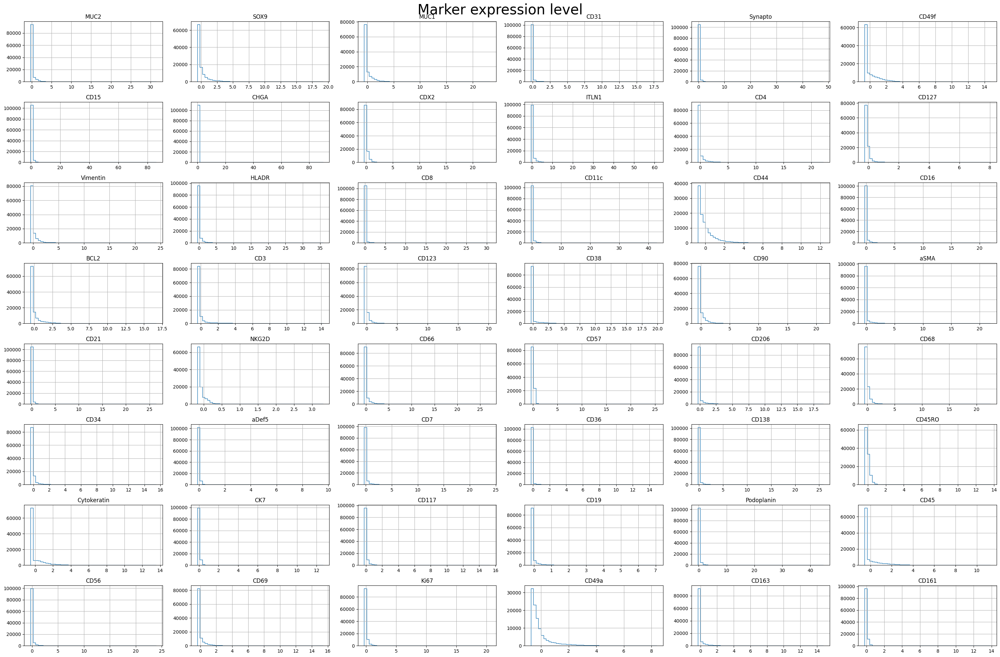

In [11]:
marker_expression(sample_data[cols], markers=None, save=False, fname=None, dpi='figure', log=False)

### Remove outliers

In [15]:
selected_cols = ["Podoplanin", "CD15", "CHGA", "ITLN1", "Podoplanin", "Synapto", "HLADR", "MUC2", "CD8", "CD11c", "MUC1", "CD16"]

Q = sample_data[selected_cols].quantile(0.99)
sample_data_filtered = sample_data[~((sample_data[selected_cols] > Q)).any(axis=1)]
print(np.shape(sample_data_filtered))
sample_data_filtered[cols].describe().T

(100161, 56)


,count,mean,std,min,25%,50%,75%,max
MUC2,100161.0,0.007843,0.019463,0.000000e+00,1.124122e-07,0.000058,0.002737,0.154971
SOX9,100161.0,0.031310,0.048220,0.000000e+00,4.613933e-03,0.012666,0.036793,1.000000
MUC1,100161.0,0.021733,0.029954,0.000000e+00,4.447584e-03,0.009218,0.025565,0.191092
CD31,100161.0,0.014822,0.058765,5.507411e-09,2.785907e-04,0.000645,0.003552,1.000000
Synapto,100161.0,0.003559,0.006715,0.000000e+00,2.377156e-04,0.001187,0.003708,0.066197
CD49f,100161.0,0.041612,0.061649,0.000000e+00,2.122373e-03,0.009369,0.062237,1.000000
CD15,100161.0,0.002701,0.005768,0.000000e+00,1.211298e-07,0.000100,0.002296,0.040509
CHGA,100161.0,0.000674,0.000964,0.000000e+00,5.498301e-05,0.000356,0.000855,0.008072
CDX2,100161.0,0.013233,0.017006,0.000000e+00,3.396664e-03,0.008109,0.017101,1.000000
ITLN1,100161.0,0.006232,0.010786,1.658454e-08,3.669347e-04,0.001920,0.006838,0.072777


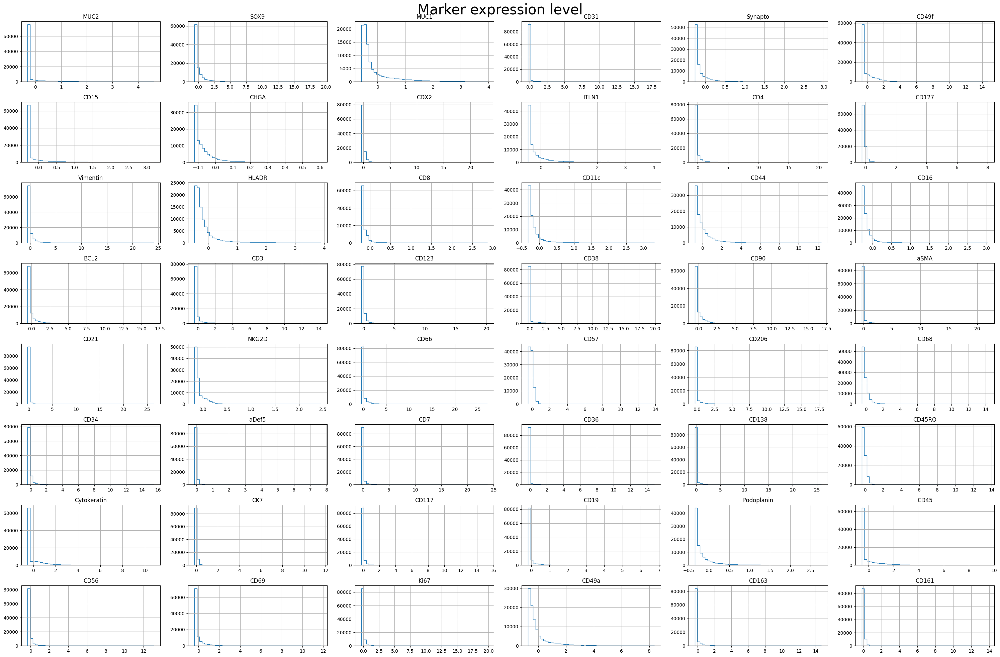

In [12]:
marker_expression(sample_data_filtered[cols], markers=None, save=False, fname=None, dpi='figure', log=False)

### Scaled

In [30]:
# For each call/round of Tribus 
# perform always Z-score and then Min-Max transformation in all the channels
# z-score
sample_data_scaled = sample_data
cols = ['MUC2', 'SOX9', 'MUC1', 'CD31', 'Synapto', 'CD49f', 'CD15',
       'CHGA', 'CDX2', 'ITLN1', 'CD4', 'CD127', 'Vimentin', 'HLADR',
       'CD8', 'CD11c', 'CD44', 'CD16', 'BCL2', 'CD3', 'CD123', 'CD38',
       'CD90', 'aSMA', 'CD21', 'NKG2D', 'CD66', 'CD57', 'CD206', 'CD68',
       'CD34', 'aDef5', 'CD7', 'CD36', 'CD138', 'CD45RO', 'Cytokeratin',
       'CK7', 'CD117', 'CD19', 'Podoplanin', 'CD45', 'CD56', 'CD69',
       'Ki67', 'CD49a', 'CD163', 'CD161']
# define min max scaler
scaler = MinMaxScaler()
sample_data_scaled.loc[:,(cols)] = scaler.fit_transform(sample_data_scaled[cols])
sample_data_scaled

,...1,MUC2,SOX9,MUC1,CD31,Synapto,CD49f,CD15,CHGA,CDX2,...,CD49a,CD163,CD161,x,y,tissue,cell_type_A,donor,unique_region,cell_type_upperlevel
0,142723,9.540869e-08,3.825656e-04,3.169530e-02,9.323606e-05,2.768049e-03,0.024637,1.143580e-03,1.056949e-03,0.011745,...,0.021282,8.439013e-03,1.992616e-03,1049,708,CL,Enterocyte,B004,reg001_CL_B004,Epithelial
1,142724,5.960682e-07,2.662069e-04,2.420894e-02,3.162978e-04,6.710245e-03,0.008655,2.863284e-03,2.348558e-03,0.005362,...,0.016633,6.423448e-03,4.705798e-03,1077,917,CL,Enterocyte,B004,reg001_CL_B004,Epithelial
2,142725,1.174503e-07,1.715654e-07,1.259594e-07,8.095894e-08,1.528237e-07,0.085440,1.171925e-07,2.060125e-07,0.018191,...,0.016413,5.936626e-03,2.054521e-07,1093,926,CL,Enterocyte,B004,reg001_CL_B004,Epithelial
3,142727,8.911109e-08,1.089945e-07,5.926726e-03,3.099351e-05,1.749602e-04,0.056527,6.145403e-05,3.494994e-07,0.011134,...,0.017226,3.633683e-03,7.134874e-05,1114,809,CL,Enterocyte,B004,reg001_CL_B004,Epithelial
4,142728,1.515928e-05,4.386927e-04,1.390517e-02,2.397982e-04,3.430104e-03,0.055822,1.516303e-03,1.419054e-03,0.015842,...,0.040395,1.019736e-02,2.713550e-03,1127,792,CL,Enterocyte,B004,reg001_CL_B004,Epithelial
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
110628,177579-2,8.831239e-05,6.811041e-03,4.277593e-03,5.980370e-08,3.952023e-03,0.004131,3.088477e-05,1.609428e-07,0.003333,...,0.031568,5.309662e-08,6.493335e-03,8672,7054,CL,Plasma,B004,reg004_CL_B004,Lymphoid
110629,177580-2,6.591146e-05,7.367414e-03,4.246146e-03,2.527250e-03,3.018002e-04,0.002089,8.199971e-05,3.556218e-04,0.001356,...,0.009626,4.336787e-03,6.929959e-03,8727,6182,CL,Plasma,B004,reg004_CL_B004,Lymphoid
110630,177666-2,1.132639e-04,5.578663e-03,4.459131e-03,2.279735e-03,1.932940e-04,0.003473,2.007529e-05,2.776080e-04,0.001649,...,0.013168,3.249505e-03,8.491307e-03,9031,6452,CL,Plasma,B004,reg004_CL_B004,Lymphoid
110631,177675-2,1.990513e-03,2.007127e-02,9.940389e-03,6.399356e-04,1.394624e-02,0.005173,2.205282e-05,5.770742e-04,0.011762,...,0.038334,1.380900e-02,1.018770e-02,8335,7248,CL,Plasma,B004,reg004_CL_B004,Lymphoid


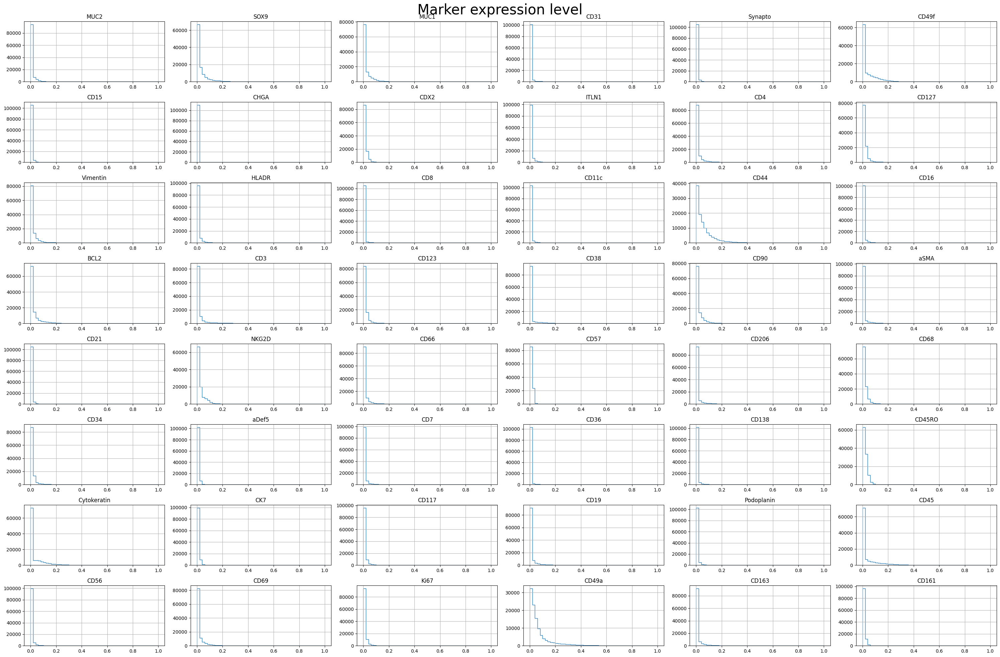

In [31]:
marker_expression(sample_data_scaled[cols], markers=None, save=False, fname=None, dpi='figure', log=False)

### Save pre-processed data

In [32]:
# save the processed dataset
sample_data_scaled.to_csv("C:\\Users\\Public\\Farkkila_lab_datasets\\Tribus\\Test_case_data\\STELLAR\\input_data\\STELLAR_data_donor_004_upperlevel_CL_filtered.csv")

### Run Tribus

In [2]:
# read input files
sample_data = pd.read_csv('C:\\Users\\Public\\Farkkila_lab_datasets\\Tribus\\Test_case_data\\STELLAR\\input_data\\STELLAR_data_donor_004_upperlevel_CL.csv',low_memory=False)
df = pd.ExcelFile("C:\\Users\\Public\\Farkkila_lab_datasets\\Tribus\\Test_case_data\\STELLAR\\stellar_logic_gate_cl.xlsx")
logic = pd.read_excel(df, df.sheet_names, index_col=0)

In [ ]:
# check the marker correlation matrix we choose for the clustering method
marker_df = sample_data[logic["Global"]["Epithelial"].index]
plt.figure(figsize=(10,8))
sns.heatmap(marker_df.corr(),cmap=sns.cm.rocket_r)

In [3]:
# Run Tribus on z-scored dataset
# MAX_PERCENTILE = 99
# REQUIRED_CELLS_FOR_CLUSTERING = 5000
# THRESHOLD_LOW = 0.001
depth = 2
labels, scores = run_tribus(sample_data, logic, depth=depth, normalization=z_score) # modify depth

Global, subsetting done
Myeloid, subsetting done
Lymphoid, subsetting done
Stromal, subsetting done
Epithelial, subsetting done
4.248390622933706 minutes


### Check Tribus result

<Axes: xlabel='Cell_type'>

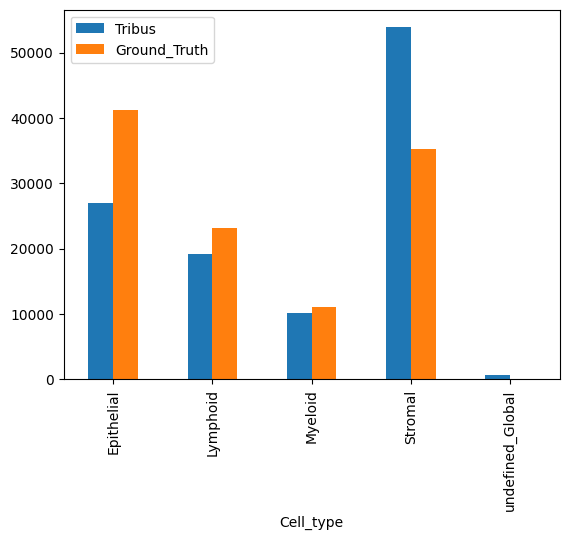

In [4]:
# cell_type_distribution(labels, level="Global")
Tribus_stat = pd.DataFrame(np.array(np.unique(list(labels["Global"]), return_counts=True)).T, columns=("Cell_type", "Tribus"))
Truth_stat = pd.DataFrame(np.array(np.unique(list(sample_data["cell_type_upperlevel"]), return_counts=True)).T, columns=("Cell_type", "Ground_Truth"))
Stat_merged = pd.merge(Tribus_stat, Truth_stat, how="outer", on=["Cell_type"])
Stat_merged["Tribus"] = pd.to_numeric(Stat_merged["Tribus"])
Stat_merged["Ground_Truth"] = pd.to_numeric(Stat_merged["Ground_Truth"])

Stat_merged.plot(x="Cell_type",
        kind='bar',
        stacked=False)

<Axes: xlabel='Cell_type'>

<Figure size 2000x600 with 0 Axes>

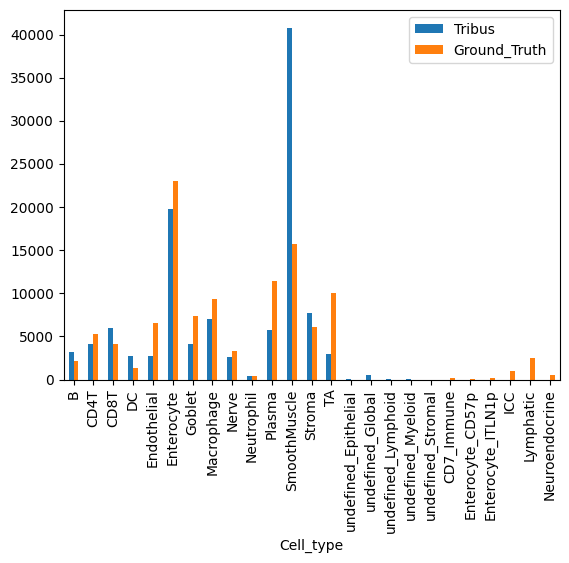

In [5]:
Tribus_stat = pd.DataFrame(np.array(np.unique(list(labels["final_label"]), return_counts=True)).T, columns=("Cell_type", "Tribus"))
Truth_stat = pd.DataFrame(np.array(np.unique(list(sample_data["cell_type_A"]), return_counts=True)).T, columns=("Cell_type", "Ground_Truth"))
Stat_merged = pd.merge(Tribus_stat, Truth_stat, how="outer", on=["Cell_type"])
Stat_merged["Tribus"] = pd.to_numeric(Stat_merged["Tribus"])
Stat_merged["Ground_Truth"] = pd.to_numeric(Stat_merged["Ground_Truth"])

plt.figure(figsize=(20,6))
Stat_merged.plot(x="Cell_type",
        kind='bar',
        stacked=False)

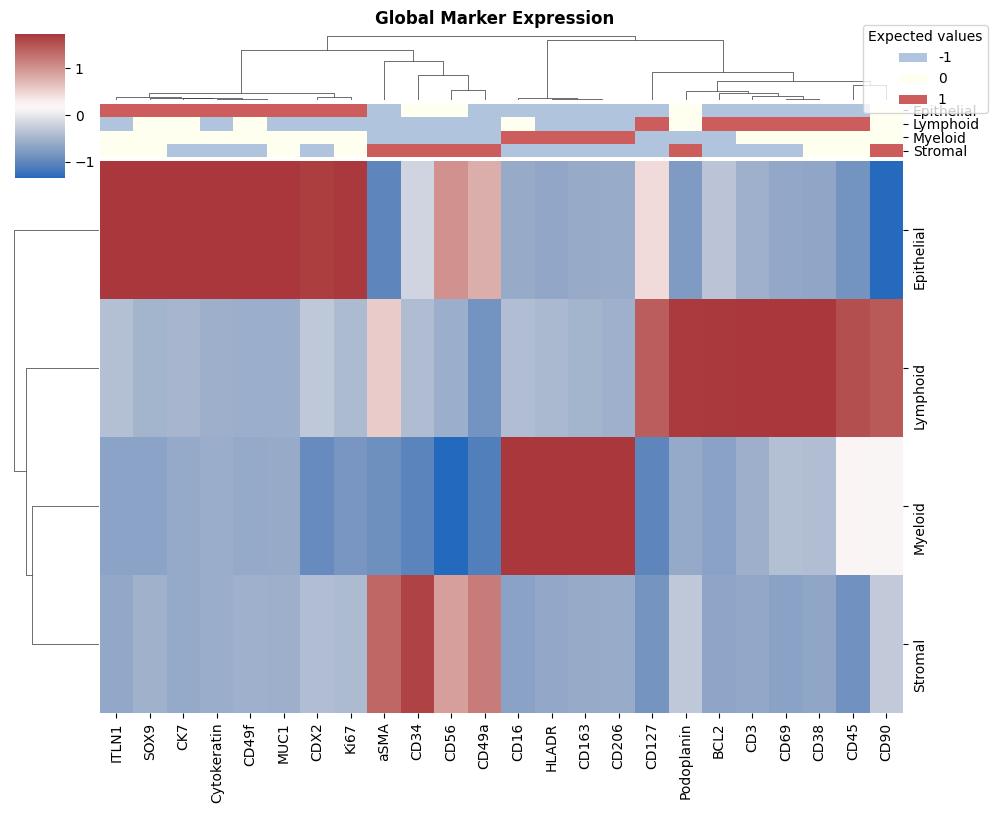

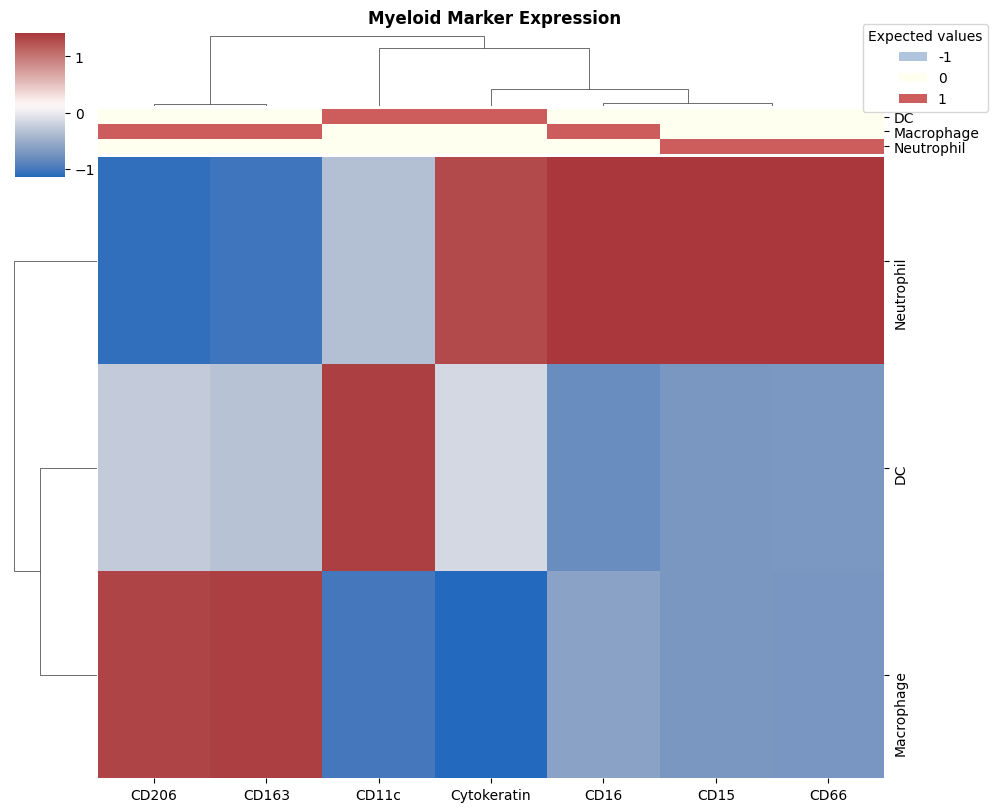

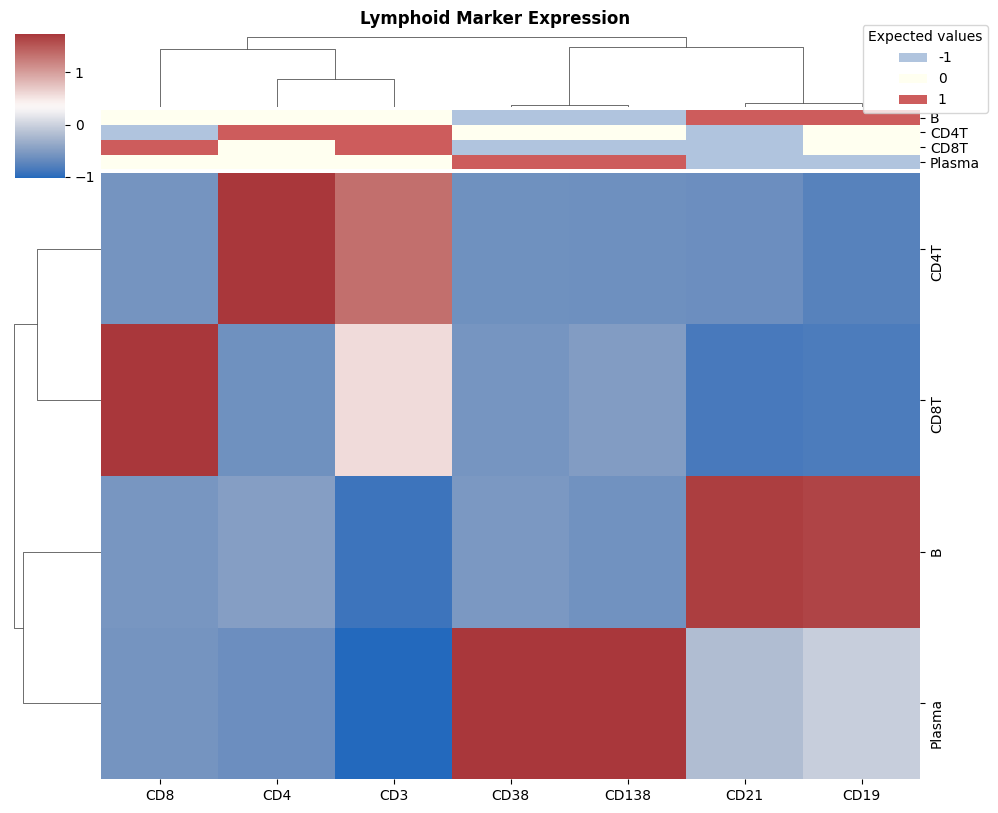

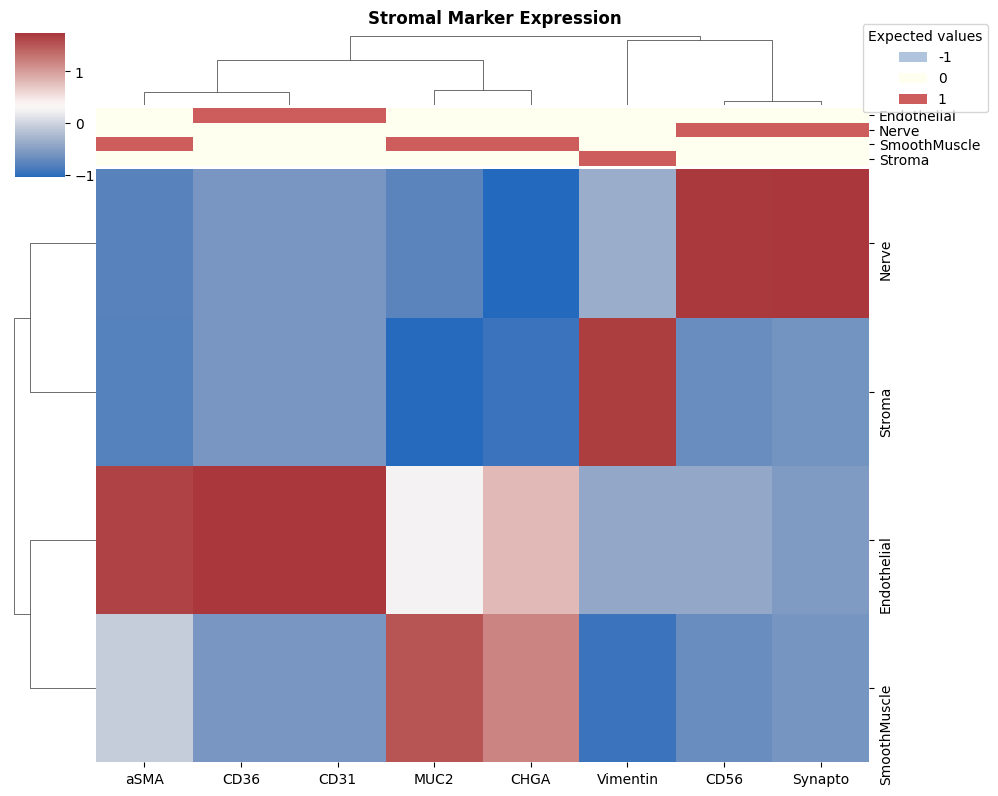

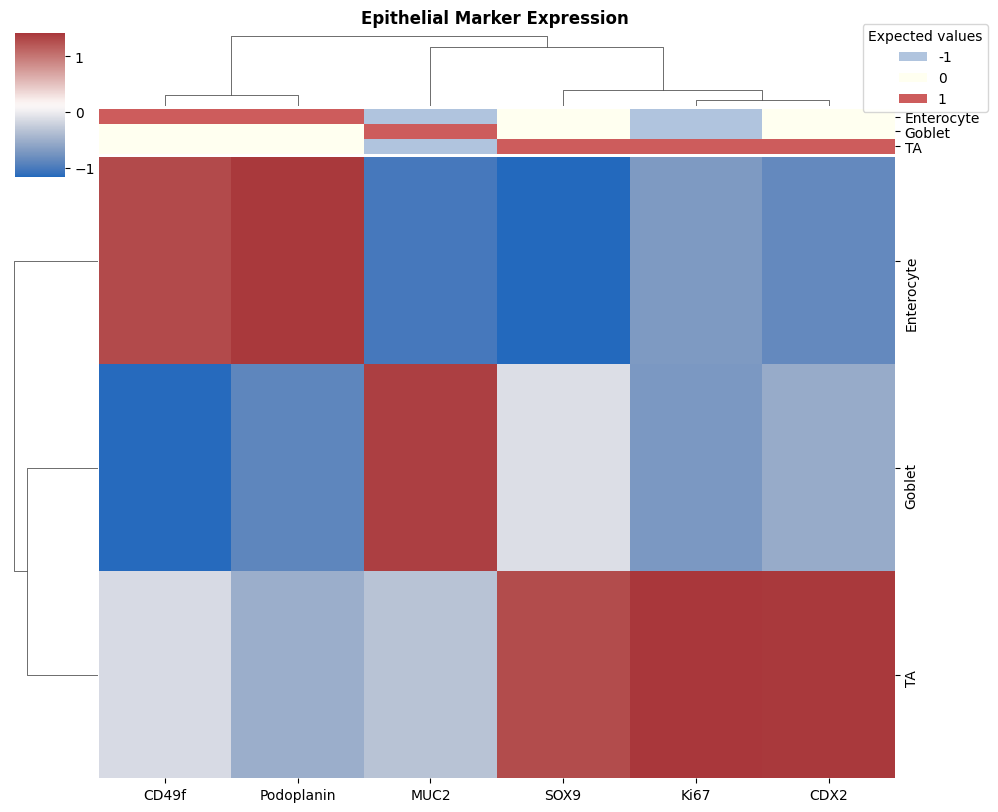

In [6]:
for i in labels.columns.values.tolist()[ : -1]: 
    heatmap_for_median_expression(sample_data, labels, logic, level=i, save=False, fname=None,
                                    dpi='figure', transform=z_score, title="{} Marker Expression".format(i),
                                    c_palette=sns.color_palette(['lightsteelblue', 'ivory', 'indianred'], 3),
                                    cmap_='vlag', dendrogram_ratio_=0.1)

c:\Users\Localadmin_kangzigi\.conda\envs\tribus_new\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Rand score = 0.8164757724162536, Accuracy score = 0.5671273489826725, Precision score = 0.6633663445780247, F1 score = 0.5589785471321166


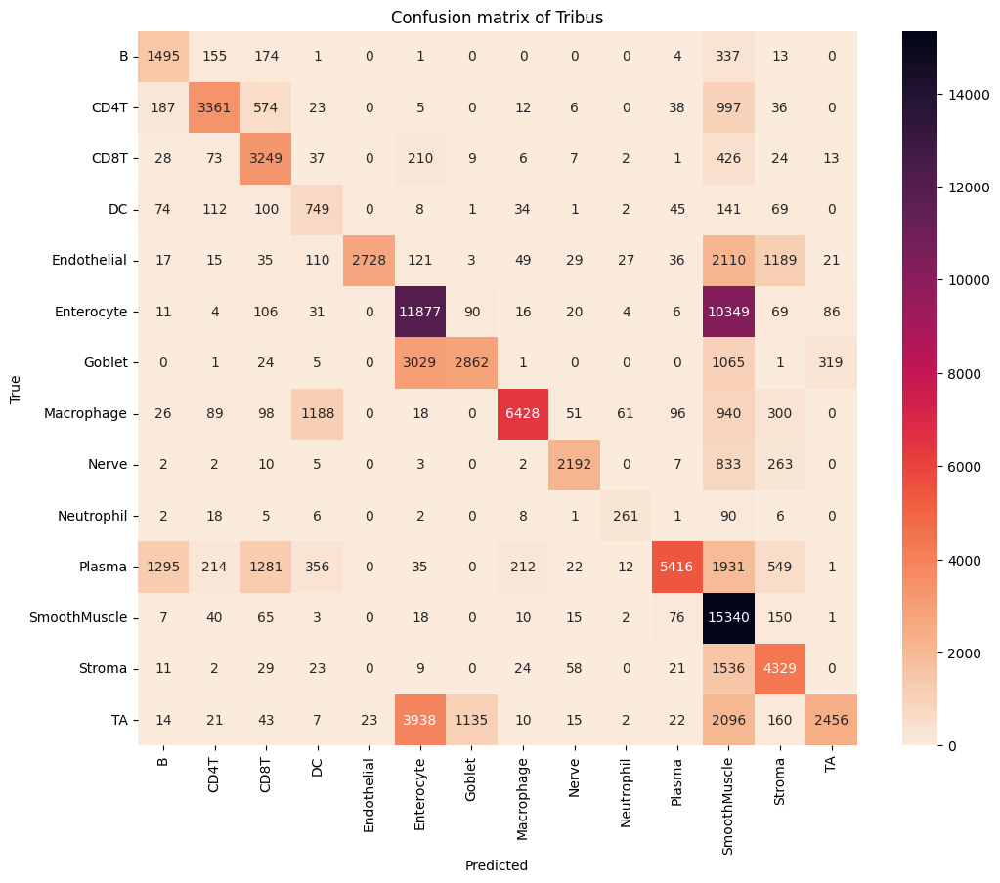

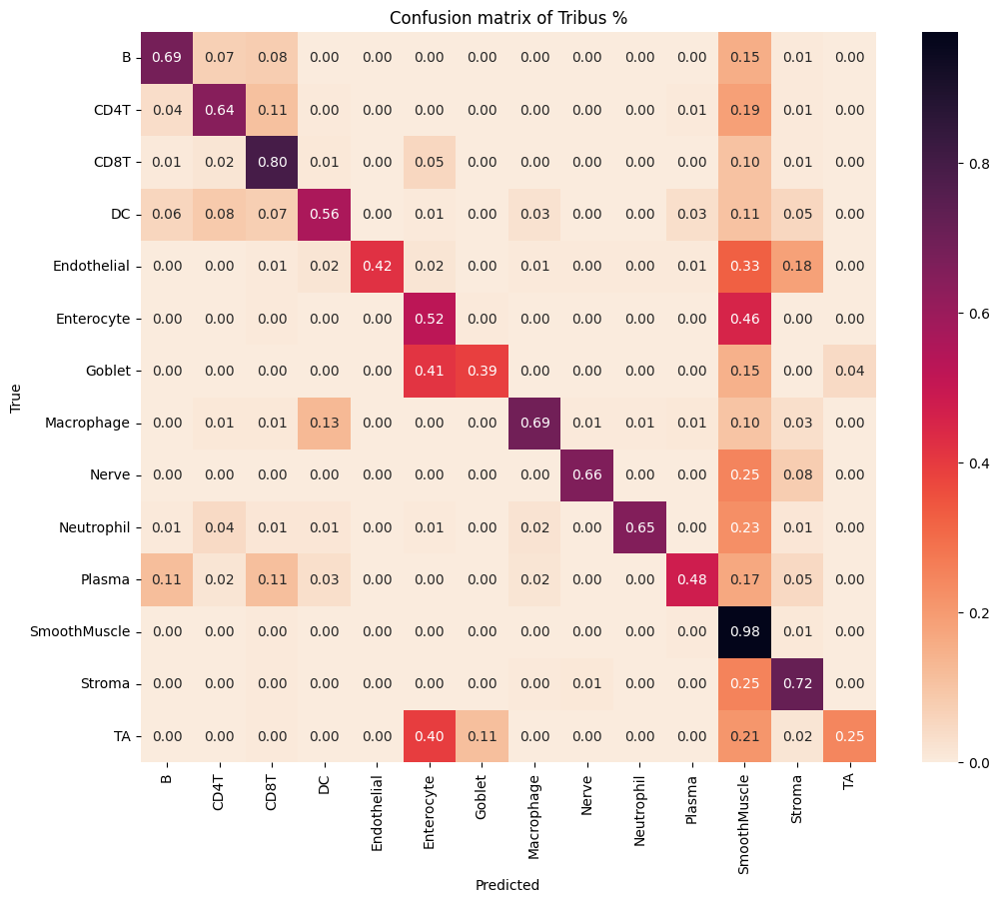

In [7]:
# confusion matrix
if depth == 1: 
    celltype_true = np.array(sample_data["cell_type_upperlevel"]).tolist()
    celltype_pred = np.array(labels["final_label"]).tolist()
    cm_labels = np.intersect1d(np.unique(labels["final_label"]), np.unique(celltype_true))
    cm = confusion_matrix(celltype_true, 
                        celltype_pred, 
                        labels = cm_labels)
                                                        
    df_cm = pd.DataFrame(cm, index = cm_labels,
                    columns = cm_labels)
    plt.figure(figsize = (len(np.unique(celltype_pred))*0.625, len(np.unique(celltype_pred))*0.5))
    sns.heatmap(df_cm, fmt='g', annot=True, cmap=sns.cm.rocket_r)
    plt.title('Confusion matrix of Tribus')
    plt.xlabel('Predicted')
    plt.ylabel('True')


    cmn = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    df_cmn = pd.DataFrame(cmn, index = cm_labels,
                    columns = cm_labels)
    plt.figure(figsize = (len(np.unique(celltype_pred))*0.625, len(np.unique(celltype_pred))*0.5))
    sns.heatmap(df_cmn, fmt='.2f', annot=True, cmap=sns.cm.rocket_r)
    plt.title('Confusion matrix of Tribus %')
    plt.xlabel('Predicted')
    plt.ylabel('True')
else:
    celltype_true = np.array(sample_data["cell_type_A"]).tolist()
    celltype_true = [element.replace('Lymphatic', 'Lympatic') for element in celltype_true]
    celltype_true = [element.replace('CD7_Immune', 'CD7_immune') for element in celltype_true]
    celltype_pred = np.array(labels["final_label"]).tolist()
    cm_labels = np.intersect1d(np.unique(labels["final_label"]), np.unique(celltype_true))
    cm = confusion_matrix(celltype_true, 
                        celltype_pred, 
                        labels = cm_labels)
                                                        
    df_cm = pd.DataFrame(cm, index = cm_labels,
                    columns = cm_labels)
    plt.figure(figsize = (len(np.unique(celltype_pred))*0.625, len(np.unique(celltype_pred))*0.5))
    sns.heatmap(df_cm, fmt='g', annot=True, cmap=sns.cm.rocket_r)
    plt.title('Confusion matrix of Tribus')
    plt.xlabel('Predicted')
    plt.ylabel('True')


    cmn = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    df_cmn = pd.DataFrame(cmn, index = cm_labels,
                    columns = cm_labels)
    plt.figure(figsize = (len(np.unique(celltype_pred))*0.625, len(np.unique(celltype_pred))*0.5))
    sns.heatmap(df_cmn, fmt='.2f', annot=True, cmap=sns.cm.rocket_r)
    plt.title('Confusion matrix of Tribus %')
    plt.xlabel('Predicted')
    plt.ylabel('True')

RI = rand_score(celltype_true, celltype_pred) #between 0-1
AS = accuracy_score(celltype_true, celltype_pred)
PS = precision_score(celltype_true, celltype_pred, average='weighted')
F1 = f1_score(celltype_true, celltype_pred, average="weighted")
print("Rand score = {}, Accuracy score = {}, Precision score = {}, F1 score = {}".format(RI, AS, PS, F1))

Rand score = 0.7738203988435897, Accuracy score = 0.7852087532653006, Precision score = 0.8466522337227507, F1 score = 0.7898833152960126


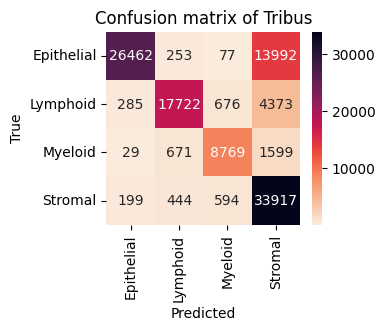

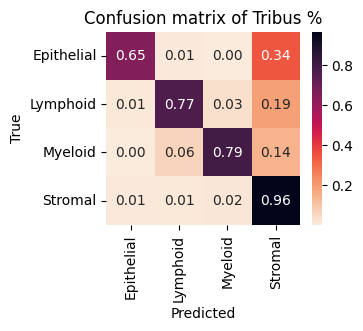

In [8]:
# confusion matrix for first level
celltype_true = np.array(sample_data["cell_type_upperlevel"]).tolist()
celltype_pred = np.array(labels["Global"]).tolist()
cm_labels = np.intersect1d(np.unique(labels["Global"]), np.unique(celltype_true))
cm = confusion_matrix(celltype_true, 
                      celltype_pred, 
                      labels = cm_labels)
                                                       
df_cm = pd.DataFrame(cm, index = cm_labels,
                  columns = cm_labels)
plt.figure(figsize = (len(np.unique(celltype_pred))*0.625, len(np.unique(celltype_pred))*0.5))
sns.heatmap(df_cm, fmt='g', annot=True, cmap=sns.cm.rocket_r)
plt.title('Confusion matrix of Tribus')
plt.xlabel('Predicted')
plt.ylabel('True')


cmn = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
df_cmn = pd.DataFrame(cmn, index = cm_labels,
                  columns = cm_labels)
plt.figure(figsize = (len(np.unique(celltype_pred))*0.625, len(np.unique(celltype_pred))*0.5))
sns.heatmap(df_cmn, fmt='.2f', annot=True, cmap=sns.cm.rocket_r)
plt.title('Confusion matrix of Tribus %')
plt.xlabel('Predicted')
plt.ylabel('True')

RI = rand_score(celltype_true, celltype_pred) #between 0-1
AS = accuracy_score(celltype_true, celltype_pred)
PS = precision_score(celltype_true, celltype_pred, average='weighted')
F1 = f1_score(celltype_true, celltype_pred, average="weighted")
print("Rand score = {}, Accuracy score = {}, Precision score = {}, F1 score = {}".format(RI, AS, PS, F1))

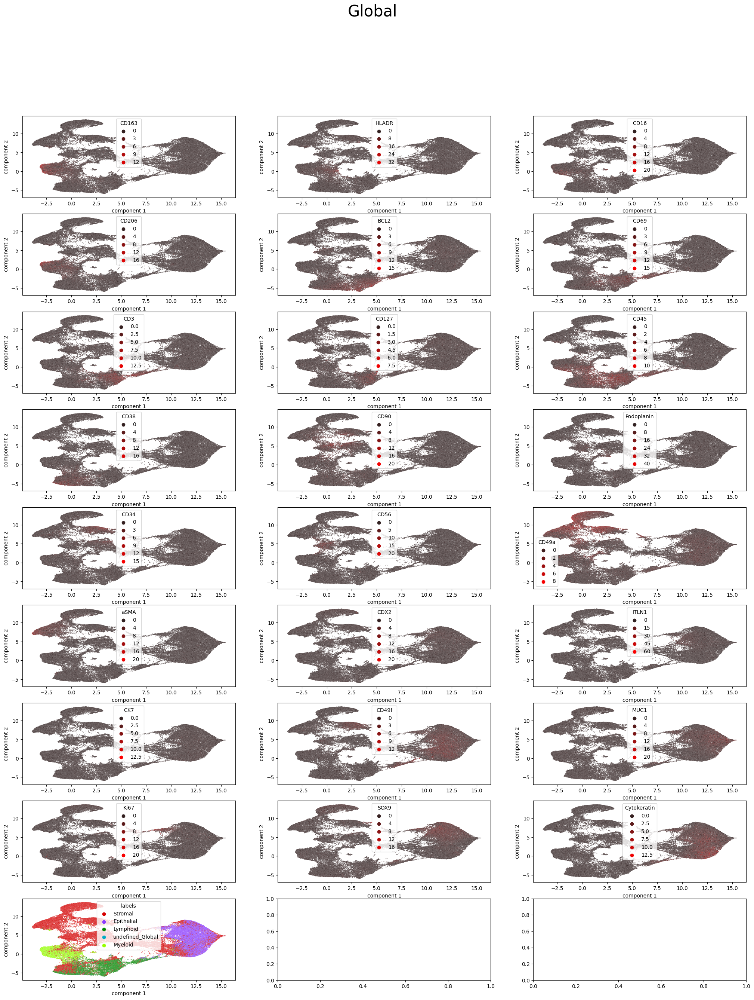

In [9]:
umap_vis(sample_data, labels, markers=logic["Global"].index.values.tolist(), save=False, fname=None,  level="Global", title=None, init='spectral',
             random_state=0, n_neighbors=10, min_dist=0.1, metric='correlation', palette_markers='mycolormap',
             palette_cell='tab10', dpi='figure')

### Check the stability of Tribus analysis

In [9]:
labels_list = []
for i in range(10):
    labels, scores = run_tribus(sample_data, logic, 2)
    labels_list.append(labels)
    labels.to_csv(f"labels_{i}.csv")

Global, subsetting done
Myeloid, subsetting done
less than min sample_size
Lymphoid, subsetting done
2.6055270115534466 minutes
Global, subsetting done
Myeloid, subsetting done
less than min sample_size
Lymphoid, subsetting done
2.6896321972211203 minutes
Global, subsetting done
Myeloid, subsetting done
less than min sample_size
Lymphoid, subsetting done
2.6921011328697206 minutes
Global, subsetting done
Myeloid, subsetting done
less than min sample_size
Lymphoid, subsetting done
2.6322352647781373 minutes
Global, subsetting done
Myeloid, subsetting done
less than min sample_size
Lymphoid, subsetting done
2.676443370183309 minutes
Global, subsetting done
Myeloid, subsetting done
less than min sample_size
Lymphoid, subsetting done
2.655244517326355 minutes
Global, subsetting done
Myeloid, subsetting done
Lymphoid, subsetting done
2.850499073664347 minutes
Global, subsetting done
Myeloid, subsetting done
less than min sample_size
Lymphoid, subsetting done
2.7315146962801617 minutes
Globa

In [13]:
labels_list_new = []
for i in range(len(labels_list)):
    new = list(labels_list[i]["Global"])
    labels_list_new.append(new)

In [14]:
# calculate the intersection between all samples
counts = 0
for i in range(len(labels_list_new[0])):
    if labels_list_new[0][i] == labels_list_new[1][i] and labels_list_new[0][i] == labels_list_new[3][i] and labels_list_new[0][i] == labels_list_new[4][i] and labels_list_new[0][i] == labels_list_new[5][i] and labels_list_new[0][i] == labels_list_new[6][i] and labels_list_new[0][i] == labels_list_new[7][i] and labels_list_new[0][i] == labels_list_new[8][i] and labels_list_new[0][i] == labels_list_new[9][i]:
        counts += 1
counts/len(labels_list_new[0])

0.5422703894859581

In [15]:
# calculate the intersection between 2 samples
counts = 0
for i in range(len(labels_list_new[0])):
    if labels_list_new[3][i] == labels_list_new[9][i]:
        counts += 1
counts/len(labels_list_new[0])

0.7506801768007737

## Analysis on B004 Small Bowel region

### Marker quality check

In [3]:
# read input files
sample_data = pd.read_csv("C:\\Users\\Public\\Farkkila_lab_datasets\\Tribus\\Test_case_data\\STELLAR\\input_data\\STELLAR_data_donor_004_upperlevel_SB.csv", low_memory=False)
sample_data.columns.values

array(['...1', 'MUC2', 'SOX9', 'MUC1', 'CD31', 'Synapto', 'CD49f', 'CD15',
       'CHGA', 'CDX2', 'ITLN1', 'CD4', 'CD127', 'Vimentin', 'HLADR',
       'CD8', 'CD11c', 'CD44', 'CD16', 'BCL2', 'CD3', 'CD123', 'CD38',
       'CD90', 'aSMA', 'CD21', 'NKG2D', 'CD66', 'CD57', 'CD206', 'CD68',
       'CD34', 'aDef5', 'CD7', 'CD36', 'CD138', 'CD45RO', 'Cytokeratin',
       'CK7', 'CD117', 'CD19', 'Podoplanin', 'CD45', 'CD56', 'CD69',
       'Ki67', 'CD49a', 'CD163', 'CD161', 'x', 'y', 'tissue',
       'cell_type_A', 'donor', 'unique_region', 'cell_type_upperlevel'],
      dtype=object)

In [4]:
sample_data = sample_data.fillna(0)
sample_data

,...1,MUC2,SOX9,MUC1,CD31,Synapto,CD49f,CD15,CHGA,CDX2,...,CD49a,CD163,CD161,x,y,tissue,cell_type_A,donor,unique_region,cell_type_upperlevel
0,0,-0.241565,0.538240,-0.145700,-0.254499,-0.312923,-0.440809,-0.083480,-0.073498,-0.182247,...,-0.574298,-0.274995,-0.083926,1253,886,SB,Enterocyte,B004,reg001_SB_B004,Epithelial
1,1,-0.231567,1.053268,0.015944,-0.248268,-0.314157,0.461514,-0.094145,-0.087275,0.246550,...,-0.484751,-0.265804,-0.052165,1259,874,SB,Enterocyte,B004,reg001_SB_B004,Epithelial
2,4,0.207531,0.526999,-0.057481,-0.249034,-0.325943,0.033951,-0.094142,-0.086326,-0.005325,...,-0.517455,-0.274345,-0.062414,1287,845,SB,Enterocyte,B004,reg001_SB_B004,Epithelial
3,5,-0.076672,-0.420316,-0.051284,-0.252876,-0.302395,1.100307,-0.093069,-0.081959,0.005021,...,-0.460114,-0.274582,-0.063367,1294,964,SB,Enterocyte,B004,reg001_SB_B004,Epithelial
4,6,-0.235334,0.376148,0.025601,-0.251348,-0.316774,-0.074358,-0.094141,-0.080630,-0.029893,...,-0.519680,-0.273687,-0.047192,1307,841,SB,Enterocyte,B004,reg001_SB_B004,Epithelial
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
137647,108136-2,-0.236994,-0.296281,-0.342282,-0.033989,-0.313892,-0.590883,-0.094145,-0.084737,-0.250276,...,-0.539979,-0.286061,-0.125293,8997,3976,SB,Plasma,B004,reg004_SB_B004,Lymphoid
137648,108179-2,-0.241564,-0.324245,-0.359713,-0.159326,0.134006,-0.581111,-0.094146,-0.085600,-0.231046,...,-0.548833,0.187548,-0.124323,9193,3953,SB,Plasma,B004,reg004_SB_B004,Lymphoid
137649,108299-2,-0.234744,-0.386168,-0.286590,-0.256213,-0.333394,-0.590884,-0.093728,-0.083035,-0.210692,...,-0.593653,0.015408,-0.126621,8904,4266,SB,Plasma,B004,reg004_SB_B004,Lymphoid
137650,108304-2,-0.241565,-0.433099,-0.387611,-0.246230,0.213191,-0.590883,-0.094145,-0.085736,-0.189721,...,-0.610918,-0.118400,-0.115565,9078,4343,SB,Plasma,B004,reg004_SB_B004,Lymphoid


In [5]:
cols = ['MUC2', 'SOX9', 'MUC1', 'CD31', 'Synapto', 'CD49f', 'CD15',
       'CHGA', 'CDX2', 'ITLN1', 'CD4', 'CD127', 'Vimentin', 'HLADR',
       'CD8', 'CD11c', 'CD44', 'CD16', 'BCL2', 'CD3', 'CD123', 'CD38',
       'CD90', 'aSMA', 'CD21', 'NKG2D', 'CD66', 'CD57', 'CD206', 'CD68',
       'CD34', 'aDef5', 'CD7', 'CD36', 'CD138', 'CD45RO', 'Cytokeratin',
       'CK7', 'CD117', 'CD19', 'Podoplanin', 'CD45', 'CD56', 'CD69',
       'Ki67', 'CD49a', 'CD163', 'CD161']
sample_data[cols].describe().T

,count,mean,std,min,25%,50%,75%,max
MUC2,137652.0,0.007268,1.014003,-0.241568,-0.241564,-0.240226,-0.199024,26.545866
SOX9,137652.0,0.012589,1.010145,-0.536789,-0.455508,-0.291988,0.092568,36.421444
MUC1,137652.0,-0.038073,0.745133,-0.421281,-0.300784,-0.208553,-0.051178,37.560890
CD31,137652.0,0.003628,1.014943,-0.256214,-0.253279,-0.248354,-0.210677,20.508982
Synapto,137652.0,0.002503,1.003547,-0.333397,-0.330974,-0.308190,-0.145747,23.223490
CD49f,137652.0,-0.033119,0.798759,-0.590887,-0.565957,-0.406260,0.243396,12.393330
CD15,137652.0,0.001005,1.015148,-0.094151,-0.094144,-0.094030,-0.090211,60.781677
CHGA,137652.0,-0.011249,0.971826,-0.087537,-0.087413,-0.080810,-0.070265,96.561750
CDX2,137652.0,-0.074558,0.213455,-0.257186,-0.203009,-0.131314,-0.022209,6.988915
ITLN1,137652.0,-0.009884,0.867910,-0.434670,-0.411880,-0.275209,0.063097,42.503660


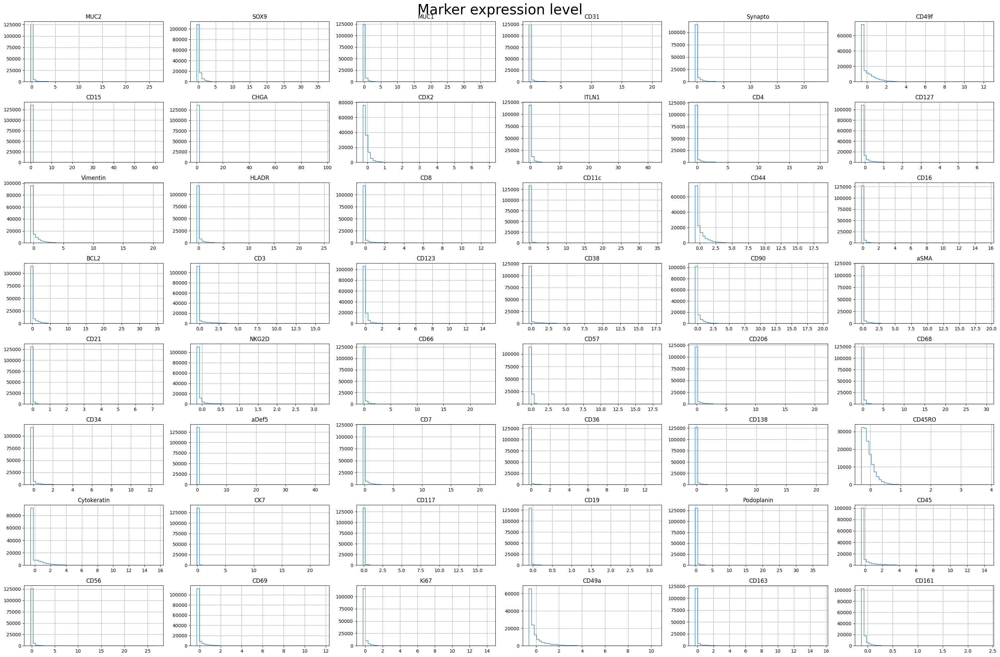

In [64]:
marker_expression(sample_data[cols], markers=None, save=False, fname=None, dpi='figure', log=False)

### Remove outliers

### Scaled

In [ ]:
# For each call/round of Tribus 
# perform always Z-score and then Min-Max transformation in all the channels
# z-score
sample_data_scaled = sample_data
cols = ['MUC2', 'SOX9', 'MUC1', 'CD31', 'Synapto', 'CD49f', 'CD15',
       'CHGA', 'CDX2', 'ITLN1', 'CD4', 'CD127', 'Vimentin', 'HLADR',
       'CD8', 'CD11c', 'CD44', 'CD16', 'BCL2', 'CD3', 'CD123', 'CD38',
       'CD90', 'aSMA', 'CD21', 'NKG2D', 'CD66', 'CD57', 'CD206', 'CD68',
       'CD34', 'aDef5', 'CD7', 'CD36', 'CD138', 'CD45RO', 'Cytokeratin',
       'CK7', 'CD117', 'CD19', 'Podoplanin', 'CD45', 'CD56', 'CD69',
       'Ki67', 'CD49a', 'CD163', 'CD161']
# define min max scaler
scaler = MinMaxScaler()
sample_data_scaled.loc[:,(cols)] = scaler.fit_transform(sample_data_scaled[cols])
sample_data_scaled

### Save the output

In [ ]:
# save the processed dataset
sample_data_scaled.to_csv("C:\\Users\\Public\\Farkkila_lab_datasets\\Tribus\\Test_case_data\\STELLAR\\input_data\\STELLAR_data_donor_004_upperlevel_SB_filtered.csv")

### Run Tribus

In [10]:
# read input files
sample_data = pd.read_csv('C:\\Users\\Public\\Farkkila_lab_datasets\\Tribus\\Test_case_data\\STELLAR\\input_data\\STELLAR_data_donor_004_upperlevel_SB.csv',low_memory=False)
df = pd.ExcelFile("C:\\Users\\Public\\Farkkila_lab_datasets\\Tribus\\Test_case_data\\STELLAR\\stellar_logic_gate_sb.xlsx")
logic = pd.read_excel(df, df.sheet_names, index_col=0)

In [ ]:
# check the marker correlation matrix we choose for the clustering method
marker_df = sample_data[logic["Global"]["Epithelial"].index]
plt.figure(figsize=(10,8))
sns.heatmap(marker_df.corr(),cmap=sns.cm.rocket_r)

In [14]:
# Run Tribus on z-scored dataset
depth = 2
labels, scores = run_tribus(sample_data, logic, depth=depth, normalization=z_score) # modify depth

Global, subsetting done
Myeloid, subsetting done
Lymphoid, subsetting done
Stromal, subsetting done
Epithelial, subsetting done
5.6946084300676985 minutes


### Check Tribus Result

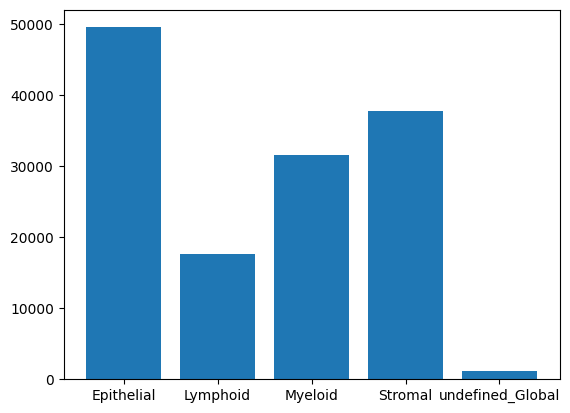

<BarContainer object of 4 artists>

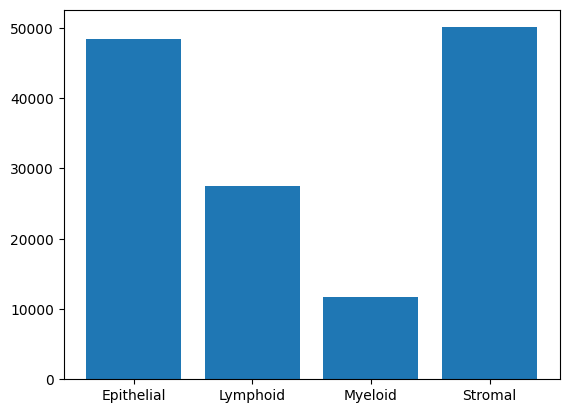

In [15]:
cell_type_distribution(labels, level="Global")
cell_types, counts = np.unique(list(sample_data["cell_type_upperlevel"]), return_counts=True)
plt.bar(cell_types, counts)

<Axes: xlabel='Cell_type'>

<Figure size 2000x600 with 0 Axes>

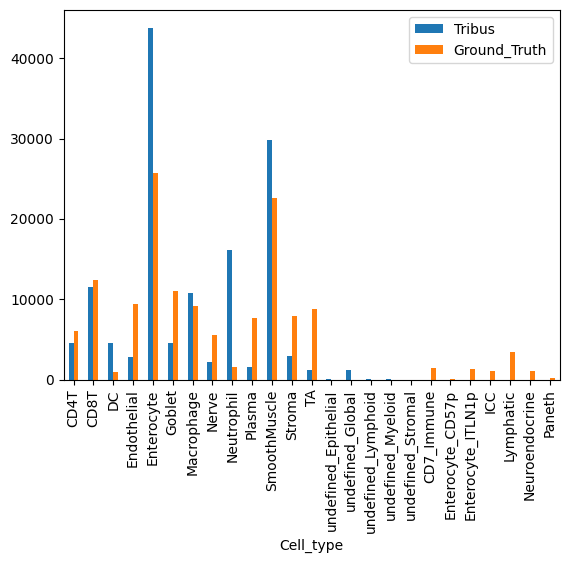

In [17]:
Tribus_stat = pd.DataFrame(np.array(np.unique(list(labels["final_label"]), return_counts=True)).T, columns=("Cell_type", "Tribus"))
Truth_stat = pd.DataFrame(np.array(np.unique(list(sample_data["cell_type_A"]), return_counts=True)).T, columns=("Cell_type", "Ground_Truth"))
Stat_merged = pd.merge(Tribus_stat, Truth_stat, how="outer", on=["Cell_type"])
Stat_merged["Tribus"] = pd.to_numeric(Stat_merged["Tribus"])
Stat_merged["Ground_Truth"] = pd.to_numeric(Stat_merged["Ground_Truth"])

plt.figure(figsize=(20,6))
Stat_merged.plot(x="Cell_type",
        kind='bar',
        stacked=False)

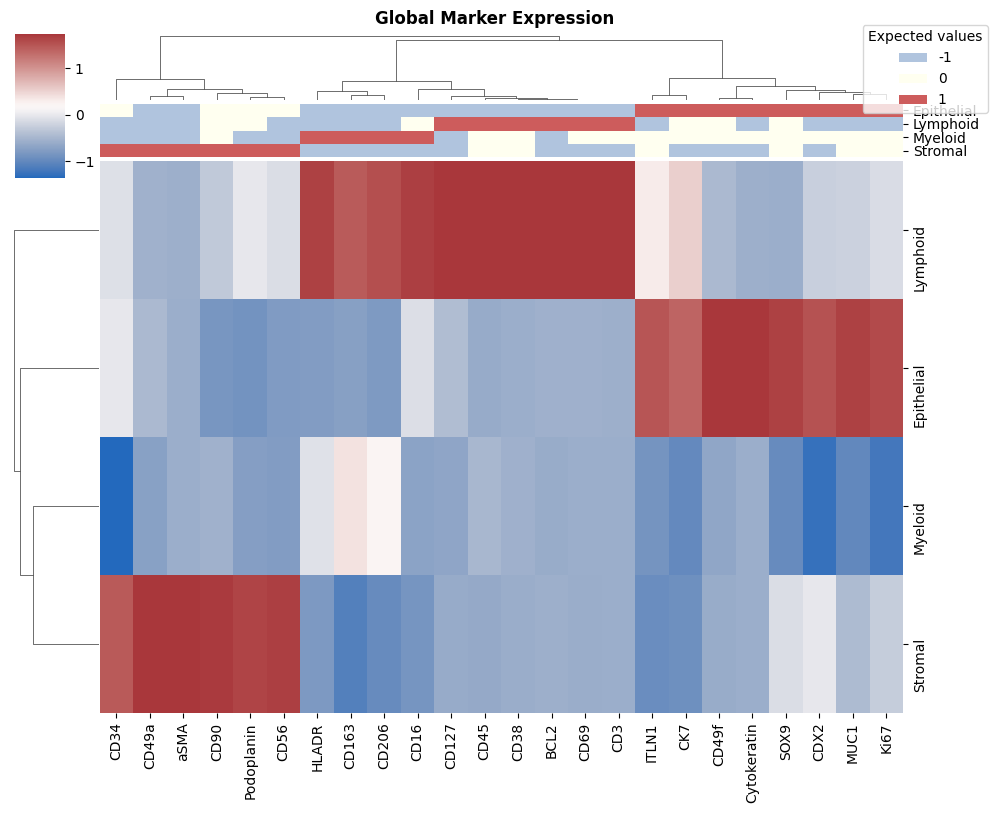

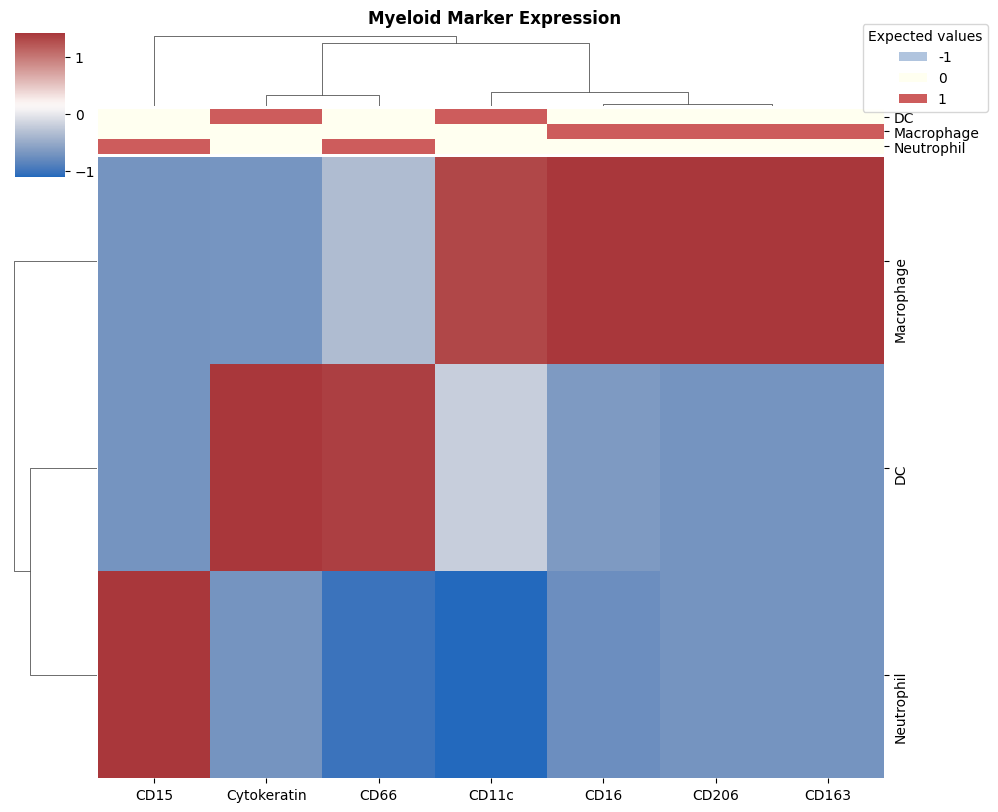

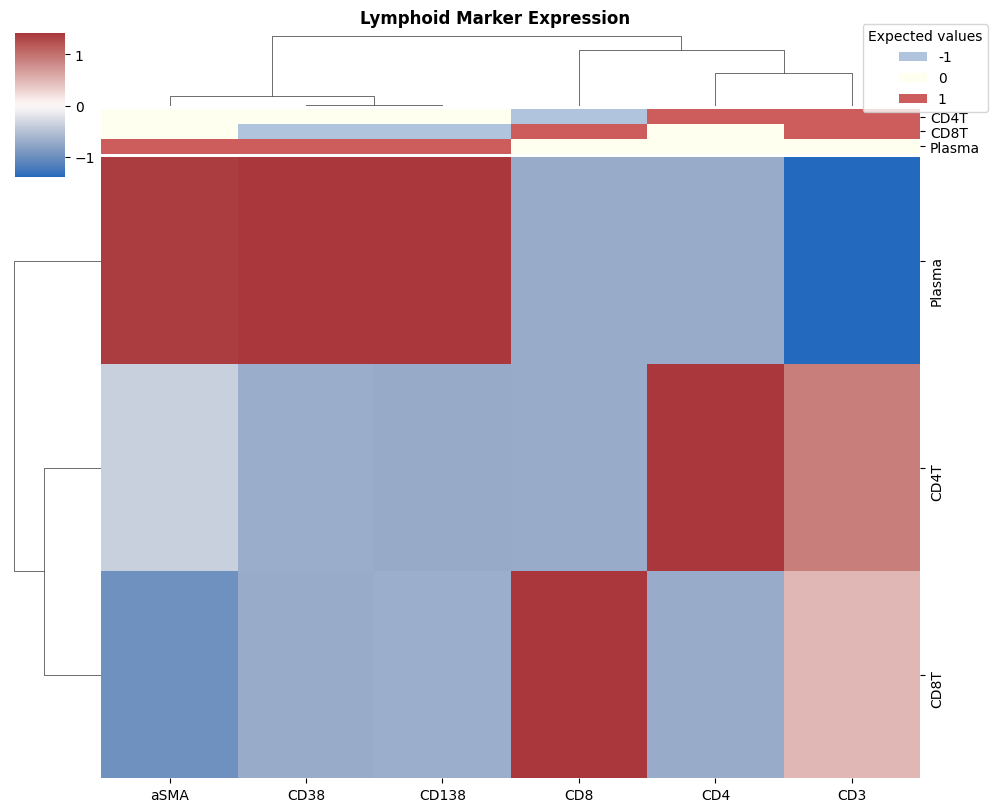

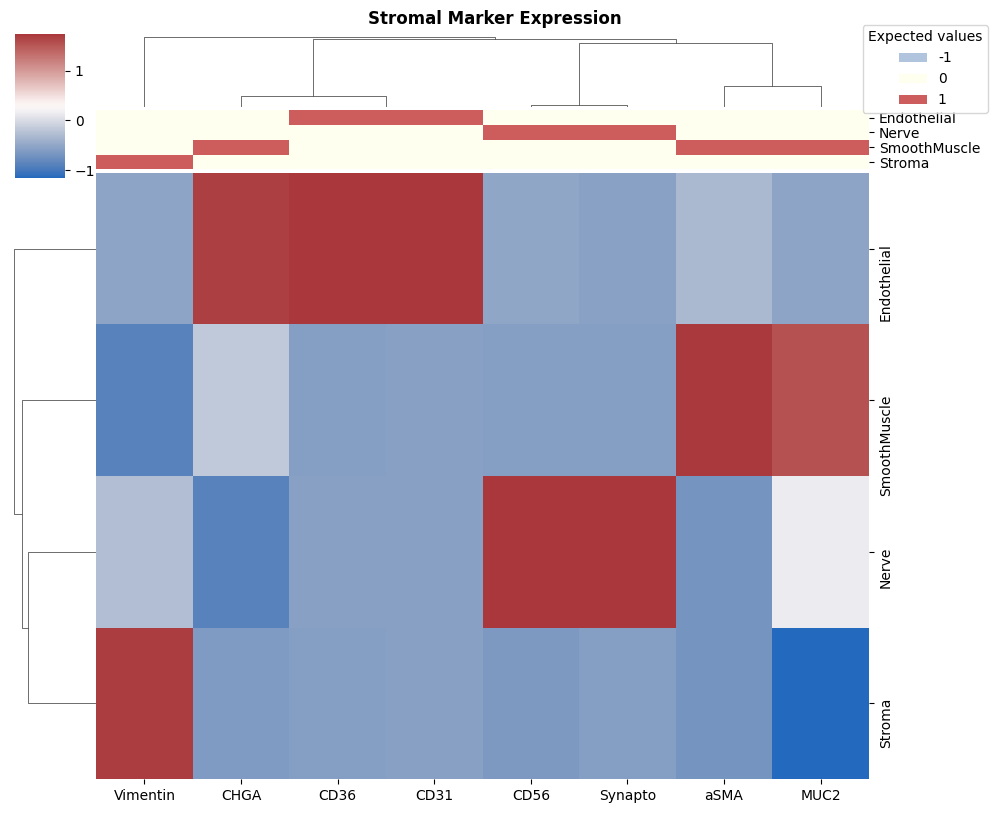

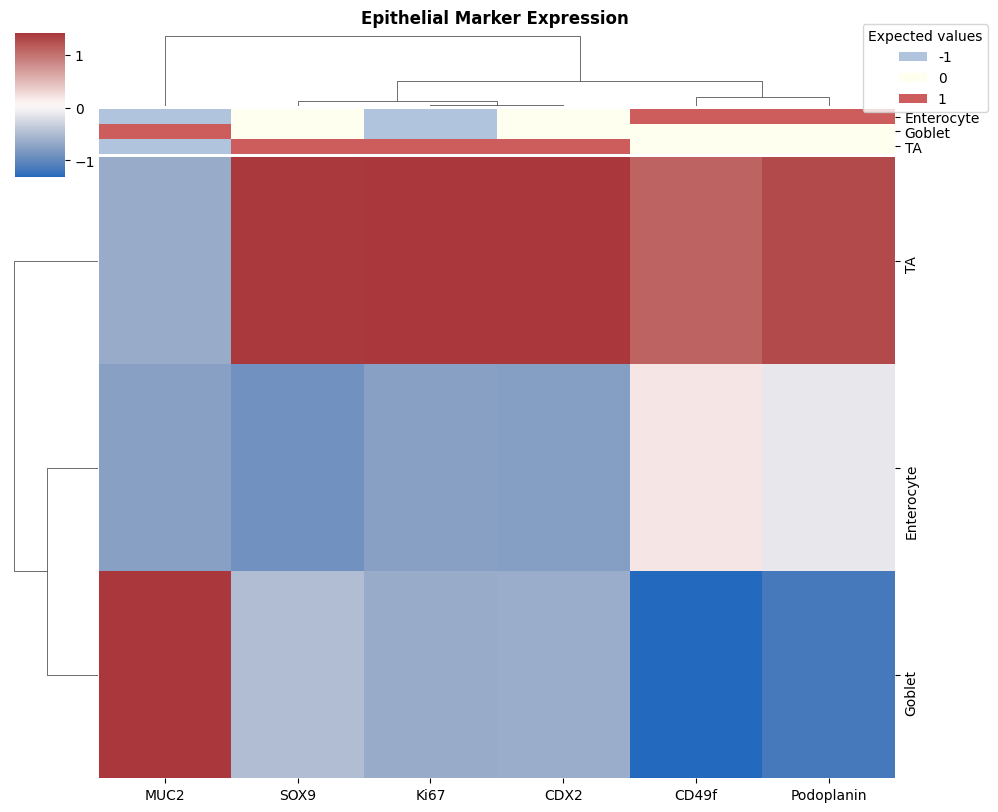

In [18]:
for i in labels.columns.values.tolist()[ : -1]: 
    heatmap_for_median_expression(sample_data, labels, logic, level=i, save=False, fname=None,
                                    dpi='figure', transform=z_score, title="{} Marker Expression".format(i),
                                    c_palette=sns.color_palette(['lightsteelblue', 'ivory', 'indianred'], 3),
                                    cmap_='vlag', dendrogram_ratio_=0.1)

c:\Users\Localadmin_kangzigi\.conda\envs\tribus_new\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Rand score = 0.8417529960667295, Accuracy score = 0.5422805335193096, Precision score = 0.656905599714904, F1 score = 0.5217018912488931


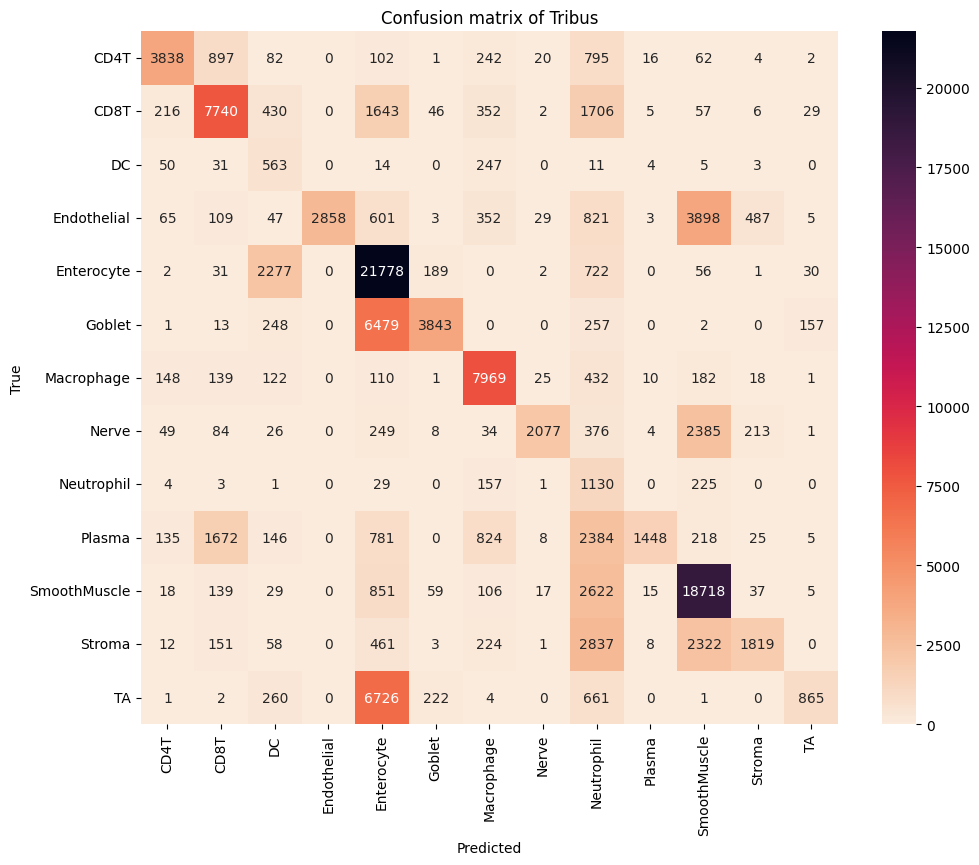

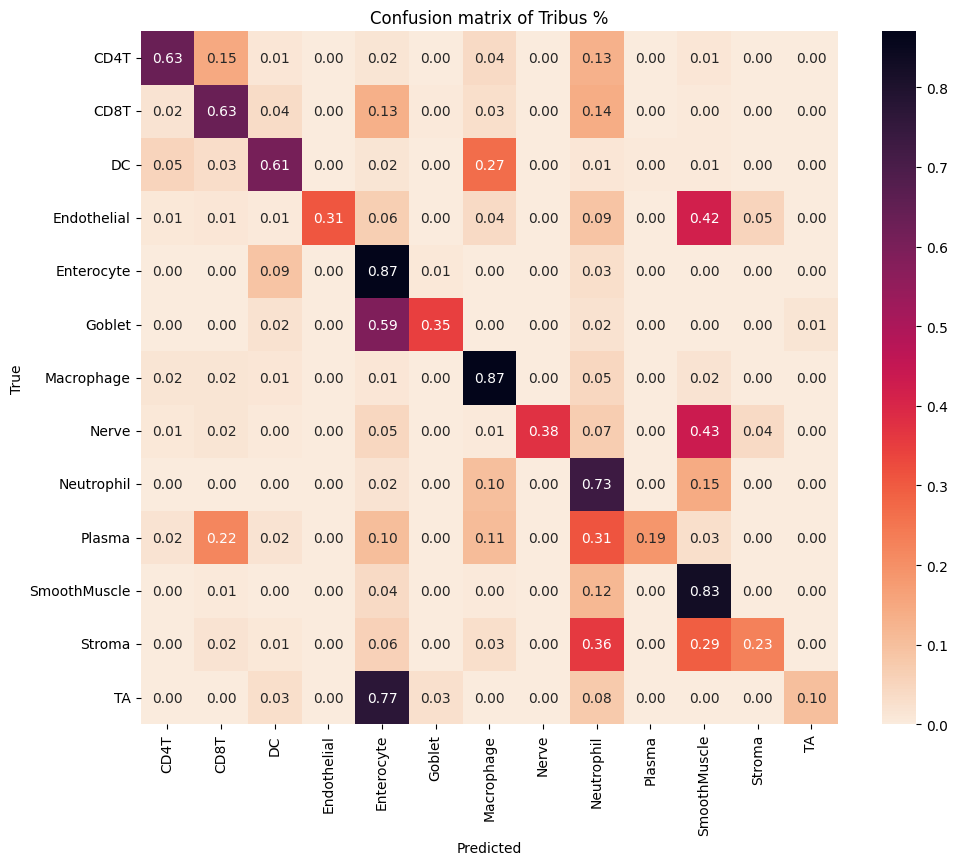

In [19]:
# confusion matrix
if depth == 1: 
    celltype_true = np.array(sample_data["cell_type_upperlevel"]).tolist()
    celltype_pred = np.array(labels["final_label"]).tolist()
    cm_labels = np.intersect1d(np.unique(labels["final_label"]), np.unique(celltype_true))
    cm = confusion_matrix(celltype_true, 
                        celltype_pred, 
                        labels = cm_labels)
                                                        
    df_cm = pd.DataFrame(cm, index = cm_labels,
                    columns = cm_labels)
    plt.figure(figsize = (len(np.unique(celltype_pred))*0.625, len(np.unique(celltype_pred))*0.5))
    sns.heatmap(df_cm, fmt='g', annot=True, cmap=sns.cm.rocket_r)
    plt.title('Confusion matrix of Tribus')
    plt.xlabel('Predicted')
    plt.ylabel('True')


    cmn = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    df_cmn = pd.DataFrame(cmn, index = cm_labels,
                    columns = cm_labels)
    plt.figure(figsize = (len(np.unique(celltype_pred))*0.625, len(np.unique(celltype_pred))*0.5))
    sns.heatmap(df_cmn, fmt='.2f', annot=True, cmap=sns.cm.rocket_r)
    plt.title('Confusion matrix of Tribus %')
    plt.xlabel('Predicted')
    plt.ylabel('True')
else:
    celltype_true = np.array(sample_data["cell_type_A"]).tolist()
    celltype_true = [element.replace('Lymphatic', 'Lympatic') for element in celltype_true]
    celltype_true = [element.replace('CD7_Immune', 'CD7_immune') for element in celltype_true]
    celltype_pred = np.array(labels["final_label"]).tolist()
    cm_labels = np.intersect1d(np.unique(labels["final_label"]), np.unique(celltype_true))
    cm = confusion_matrix(celltype_true, 
                        celltype_pred, 
                        labels = cm_labels)
                                                        
    df_cm = pd.DataFrame(cm, index = cm_labels,
                    columns = cm_labels)
    plt.figure(figsize = (len(np.unique(celltype_pred))*0.625, len(np.unique(celltype_pred))*0.5))
    sns.heatmap(df_cm, fmt='g', annot=True, cmap=sns.cm.rocket_r)
    plt.title('Confusion matrix of Tribus')
    plt.xlabel('Predicted')
    plt.ylabel('True')


    cmn = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    df_cmn = pd.DataFrame(cmn, index = cm_labels,
                    columns = cm_labels)
    plt.figure(figsize = (len(np.unique(celltype_pred))*0.625, len(np.unique(celltype_pred))*0.5))
    sns.heatmap(df_cmn, fmt='.2f', annot=True, cmap=sns.cm.rocket_r)
    plt.title('Confusion matrix of Tribus %')
    plt.xlabel('Predicted')
    plt.ylabel('True')

RI = rand_score(celltype_true, celltype_pred) #between 0-1
AS = accuracy_score(celltype_true, celltype_pred)
PS = precision_score(celltype_true, celltype_pred, average='weighted')
F1 = f1_score(celltype_true, celltype_pred, average="weighted")
print("Rand score = {}, Accuracy score = {}, Precision score = {}, F1 score = {}".format(RI, AS, PS, F1))

Rand score = 0.8199352363932678, Accuracy score = 0.7762546130822654, Precision score = 0.8744223619694915, F1 score = 0.8006620762051756


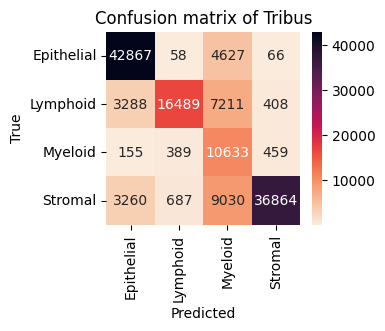

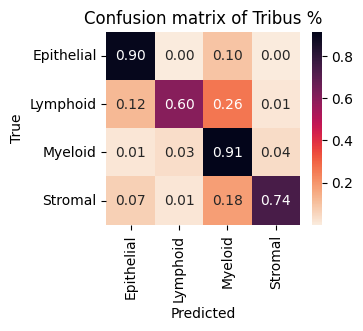

In [20]:
# confusion matrix for first level
celltype_true = np.array(sample_data["cell_type_upperlevel"]).tolist()
celltype_pred = np.array(labels["Global"]).tolist()
cm_labels = np.intersect1d(np.unique(labels["Global"]), np.unique(celltype_true))
cm = confusion_matrix(celltype_true, 
                      celltype_pred, 
                      labels = cm_labels)
                                                       
df_cm = pd.DataFrame(cm, index = cm_labels,
                  columns = cm_labels)
plt.figure(figsize = (len(np.unique(celltype_pred))*0.625, len(np.unique(celltype_pred))*0.5))
sns.heatmap(df_cm, fmt='g', annot=True, cmap=sns.cm.rocket_r)
plt.title('Confusion matrix of Tribus')
plt.xlabel('Predicted')
plt.ylabel('True')


cmn = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
df_cmn = pd.DataFrame(cmn, index = cm_labels,
                  columns = cm_labels)
plt.figure(figsize = (len(np.unique(celltype_pred))*0.625, len(np.unique(celltype_pred))*0.5))
sns.heatmap(df_cmn, fmt='.2f', annot=True, cmap=sns.cm.rocket_r)
plt.title('Confusion matrix of Tribus %')
plt.xlabel('Predicted')
plt.ylabel('True')

RI = rand_score(celltype_true, celltype_pred) #between 0-1
AS = accuracy_score(celltype_true, celltype_pred)
PS = precision_score(celltype_true, celltype_pred, average='weighted')
F1 = f1_score(celltype_true, celltype_pred, average="weighted")
print("Rand score = {}, Accuracy score = {}, Precision score = {}, F1 score = {}".format(RI, AS, PS, F1))

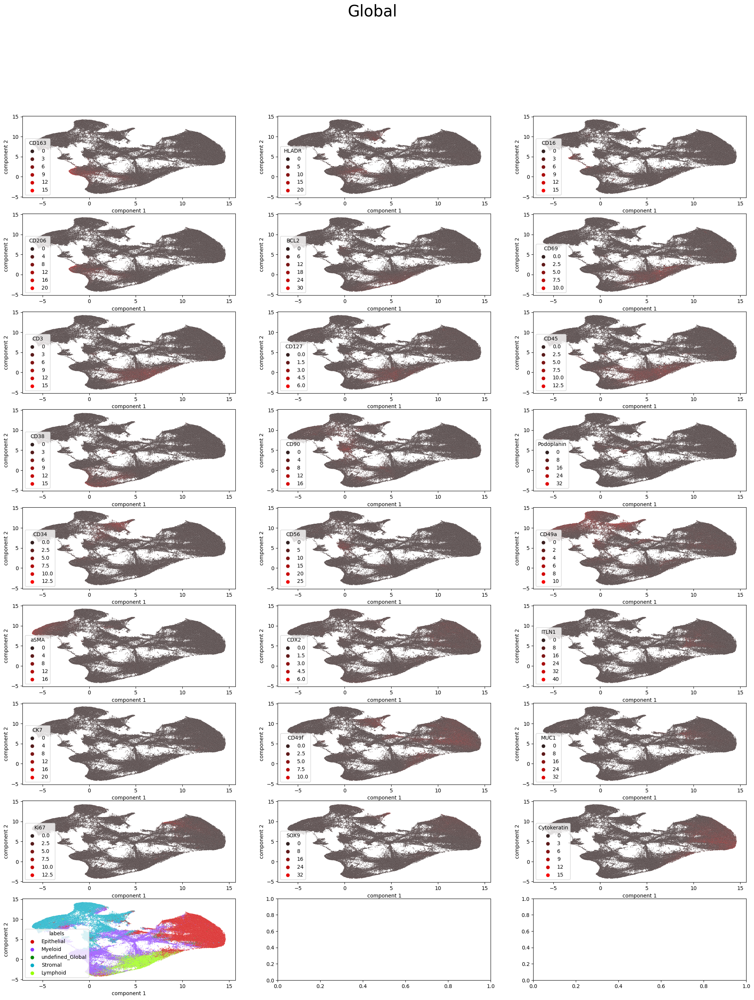

In [21]:
umap_vis(sample_data, labels, markers=logic["Global"].index.values.tolist(), save=False, fname=None,  level="Global", title=None, init='spectral',
             random_state=0, n_neighbors=10, min_dist=0.1, metric='correlation', palette_markers='mycolormap',
             palette_cell='tab10', dpi='figure')